In [12]:
from utilities import *


(x_train, y_raw_train), (x_test, y_raw_test) = tf.keras.datasets.cifar10.load_data()

train_size = 50000
test_size = 10000
# train_size = 1000
# test_size = 10
classes_no = 10

x_train, y_train = x_train[:train_size], one_hot_encoding(y_raw_train[:train_size])
x_test, y_test = x_test[:test_size], one_hot_encoding(y_raw_test[:test_size])

In [8]:
model = keras.Sequential([
    layers.Rescaling(scale=1./255.),
    layers.Conv2D(
        20, (3, 3),
        strides=1,
        padding='same',
        activation=activations.sigmoid
    ),
    layers.Conv2D(
        20, (3, 3),
        strides=1,
        padding='same',
        activation=activations.sigmoid
    ),
    layers.MaxPooling2D(pool_size=(8, 8),
                        strides=(8, 8),
                        padding='same'
                        ),
    layers.Flatten(),
    layers.Dense(10, activation=activations.softmax)
])


model.build([None, 32, 32, 3])
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_2 (Rescaling)      (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 20)        560       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 32, 32, 20)        3620      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 4, 4, 20)          0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 320)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 10)                3210      
Total params: 7,390
Trainable params: 7,390
Non-trainable params: 0
____________________________________________________

In [9]:
optimizer = keras.optimizers.SGD(learning_rate=0.001, momentum=.9)
loss_fn = tf.keras.losses.CategoricalCrossentropy()

model.compile(loss=loss_fn,optimizer=optimizer, metrics=[keras.metrics.CategoricalAccuracy()])
history = model.fit(x_train, y_train,
                    batch_size=64,
                    epochs=150,
                    validation_data=(x_test, y_test))

Epoch 1/150
782/782 [==============================] - 23s 29ms/step - loss: 2.3077 - categorical_accuracy: 0.1014 - val_loss: 2.3028 - val_categorical_accuracy: 0.1016

# Time $$\approx$$ 1.5h

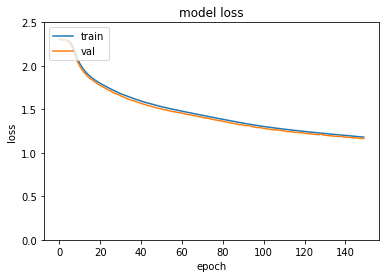

In [18]:
plot_loss(history)

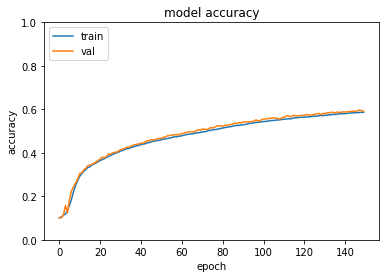

In [19]:
plot_accuracy(history)

In [ ]:
## plot results and save history

save_history('part_two', history)